In [1]:
# GPU 확인
!nvidia-smi

Mon Dec  1 06:24:01 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   70C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
# Ultralytics YOLO 설치
!pip install ultralytics -q

# 설치 확인
import ultralytics
ultralytics.checks()

Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 38.1/112.6 GB disk)


In [3]:
# GitHub 레포지토리 클론
import os

# 이미 클론되어 있으면 삭제하고 다시 클론
if os.path.exists('MCA'):
    !rm -rf MCA

!git clone https://github.com/ICT-Top-Bottom/MCA.git

# 작업 디렉토리로 이동
%cd MCA

# 파일 확인
!ls -la

Cloning into 'MCA'...
remote: Enumerating objects: 1792, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 1792 (delta 1), reused 0 (delta 0), pack-reused 1787 (from 2)
Receiving objects: 100% (1792/1792), 1.61 GiB | 32.59 MiB/s, done.
Resolving deltas: 100% (50/50), done.
Updating files: 100% (1830/1830), done.
/content/MCA
total 88
drwxr-xr-x 8 root root  4096 Dec  1 06:26 .
drwxr-xr-x 1 root root  4096 Dec  1 06:25 ..
drwxr-xr-x 2 root root  4096 Dec  1 06:26 .claude
-rw-r--r-- 1 root root  2367 Dec  1 06:26 docs.md
drwxr-xr-x 8 root root  4096 Dec  1 06:26 .git
-rw-r--r-- 1 root root    25 Dec  1 06:26 .gitignore
drwxr-xr-x 2 root root 20480 Dec  1 06:26 images
drwxr-xr-x 2 root root 20480 Dec  1 06:26 labels
-rw-r--r-- 1 root root  7573 Dec  1 06:26 ppt.md
-rw-r--r-- 1 root root  1154 Dec  1 06:26 README.md
drwxr-xr-x 2 root root  4096 Dec  1 06:26 testImage
drwxr-xr-x 7 root root  4096 Dec  1 06:26 yolo11n_240


In [4]:
# images와 labels 폴더 확인
import os
from pathlib import Path

images_dir = Path('images')
labels_dir = Path('labels')

total_images = len(list(images_dir.glob('*.jpg')))
total_labels = len(list(labels_dir.glob('*.txt')))

print(f"Total Images: {total_images}")
print(f"Total Labels: {total_labels}")

# 카테고리별 개수
combined_count = len(list(images_dir.glob('combined_*.jpg')))
empty_count = len(list(images_dir.glob('empty_*.jpg')))
fully_count = len(list(images_dir.glob('fully_*.jpg')))

print(f"\nCategory breakdown:")
print(f"  - Combined (중간 카트): {combined_count}")
print(f"  - Empty (빈 카트): {empty_count}")
print(f"  - Fully (완전히 찬 카트): {fully_count}")
print(f"  - Total: {combined_count + empty_count + fully_count}")

Total Images: 649
Total Labels: 649

Category breakdown:
  - Combined (중간 카트): 128
  - Empty (빈 카트): 174
  - Fully (완전히 찬 카트): 347
  - Total: 649


In [5]:
# 라벨 파일 분석
from pathlib import Path
from collections import Counter

labels_dir = Path('labels')
empty_labels = []
valid_labels = []
class_ids = []

for label_file in labels_dir.glob('*.txt'):
    if label_file.stat().st_size == 0:
        empty_labels.append(label_file.name)
    else:
        valid_labels.append(label_file.name)
        with open(label_file, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) >= 5:
                    class_ids.append(int(parts[0]))

print(f"Total labels: {len(list(labels_dir.glob('*.txt')))}")
print(f"Empty labels: {len(empty_labels)}")
print(f"Valid labels (with annotations): {len(valid_labels)}")

# 클래스 분포
class_distribution = Counter(class_ids)
print(f"\nClass distribution:")
for class_id, count in sorted(class_distribution.items()):
    class_name = ['fully', 'empty', 'combined'][class_id]
    print(f"  Class {class_id} ({class_name}): {count} instances")

print(f"\nClass mapping:")
print(f"  0: fully (완전히 찬 카트)")
print(f"  1: empty (빈 카트)")
print(f"  2: combined (중간 카트)")

Total labels: 649
Empty labels: 0
Valid labels (with annotations): 649

Class distribution:
  Class 0 (fully): 370 instances
  Class 1 (empty): 206 instances
  Class 2 (combined): 190 instances

Class mapping:
  0: fully (완전히 찬 카트)
  1: empty (빈 카트)
  2: combined (중간 카트)


In [6]:
import os
import shutil
from pathlib import Path
from sklearn.model_selection import train_test_split

# 디렉토리 생성
dataset_dir = Path('dataset')
train_images_dir = dataset_dir / 'images' / 'train'
train_labels_dir = dataset_dir / 'labels' / 'train'
val_images_dir = dataset_dir / 'images' / 'val'
val_labels_dir = dataset_dir / 'labels' / 'val'

# 기존 dataset 폴더가 있으면 삭제
if dataset_dir.exists():
    shutil.rmtree(dataset_dir)

train_images_dir.mkdir(parents=True, exist_ok=True)
train_labels_dir.mkdir(parents=True, exist_ok=True)
val_images_dir.mkdir(parents=True, exist_ok=True)
val_labels_dir.mkdir(parents=True, exist_ok=True)

# 이미지-라벨 페어 찾기
images_dir = Path('images')
labels_dir = Path('labels')

image_files = sorted(images_dir.glob('*.jpg'))
paired_data = []

for img_file in image_files:
    label_file = labels_dir / f"{img_file.stem}.txt"
    if label_file.exists():
        paired_data.append((img_file, label_file))
    else:
        print(f"Warning: No label for {img_file.name}")

print(f"Total paired data: {len(paired_data)}")

# Train/Val 분할 (7:3)
train_data, val_data = train_test_split(paired_data, test_size=0.3, random_state=42)

print(f"Train set: {len(train_data)}")
print(f"Val set: {len(val_data)}")

# Train 데이터 복사
print("\nCopying train data...")
for img_file, label_file in train_data:
    shutil.copy(img_file, train_images_dir / img_file.name)
    shutil.copy(label_file, train_labels_dir / label_file.name)

# Val 데이터 복사
print("Copying val data...")
for img_file, label_file in val_data:
    shutil.copy(img_file, val_images_dir / img_file.name)
    shutil.copy(label_file, val_labels_dir / label_file.name)

print("\nDataset split completed!")
print(f"Train images: {len(list(train_images_dir.glob('*.jpg')))}")
print(f"Train labels: {len(list(train_labels_dir.glob('*.txt')))}")
print(f"Val images: {len(list(val_images_dir.glob('*.jpg')))}")
print(f"Val labels: {len(list(val_labels_dir.glob('*.txt')))}")

Total paired data: 649
Train set: 454
Val set: 195

Copying train data...
Copying val data...

Dataset split completed!
Train images: 454
Train labels: 454
Val images: 195
Val labels: 195


In [7]:
import yaml

# data.yaml 파일 생성 (올바른 클래스 이름 사용)
data_yaml = {
    'path': '/content/MCA/dataset',
    'train': 'images/train',
    'val': 'images/val',
    'nc': 3,
    'names': ['fully', 'empty', 'combined']
}

yaml_path = 'data.yaml'
with open(yaml_path, 'w') as f:
    yaml.dump(data_yaml, f, default_flow_style=False)

print(f"data.yaml created at: {yaml_path}")
print("\nContents:")
print(yaml.dump(data_yaml, default_flow_style=False))

data.yaml created at: data.yaml

Contents:
names:
- fully
- empty
- combined
nc: 3
path: /content/MCA/dataset
train: images/train
val: images/val



In [9]:
from ultralytics import YOLO

# YOLO11n 모델 로드 (nano 버전)
model = YOLO('yolo11n.pt')

print("="*60)
print("Starting YOLO11n training...")
print("="*60)
print(f"Model: YOLO11n (nano)")
print(f"Dataset: 649 images, 649 labels")
print(f"Classes:")
print(f"  0: fully (완전히 찬 카트)")
print(f"  1: empty (빈 카트)")
print(f"  2: combined (중간 카트)")
print(f"\nHyperparameters:")
print(f"  - Epochs: 100")
print(f"  - Batch size: 16")
print(f"  - Image size: 640")
print(f"  - Optimizer: AdamW")
print(f"  - Patience: 30")
print("="*60)

# 학습 시작
results = model.train(
    data='data.yaml',
    epochs=250,
    batch=16,
    imgsz=640,
    optimizer='AdamW',
    patience=30,
    device=0,  # GPU 사용
    project='runs/train',
    name='yolo11n_mca',
    exist_ok=True,
    pretrained=True,
    verbose=True,
    save=True,
    save_period=10,  # 10 에폭마다 체크포인트 저장
    plots=True,
    val=True
)

print("\n" + "="*60)
print("Training completed!")
print("="*60)

Starting YOLO11n training...
Model: YOLO11n (nano)
Dataset: 649 images, 649 labels
Classes:
  0: fully (완전히 찬 카트)
  1: empty (빈 카트)
  2: combined (중간 카트)

Hyperparameters:
  - Epochs: 100
  - Batch size: 16
  - Image size: 640
  - Optimizer: AdamW
  - Patience: 30
Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=250, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, m


results.png


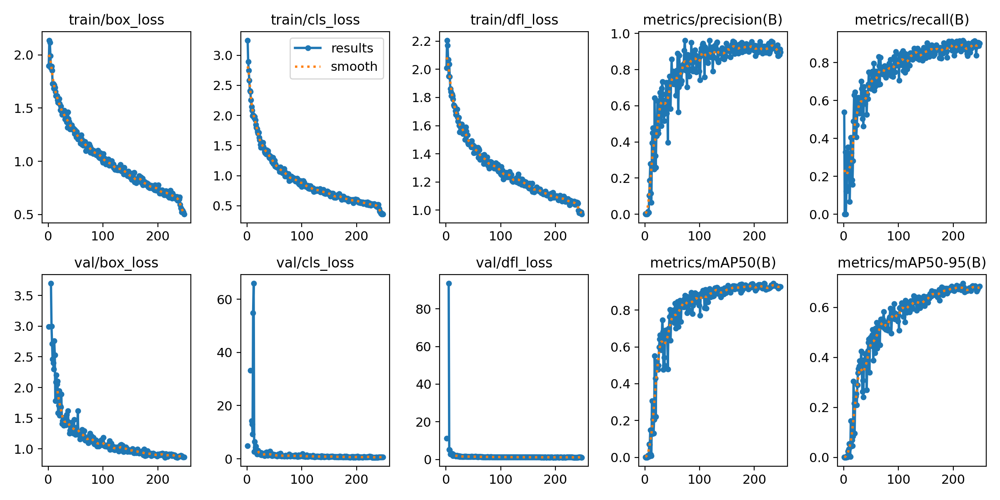


confusion_matrix.png


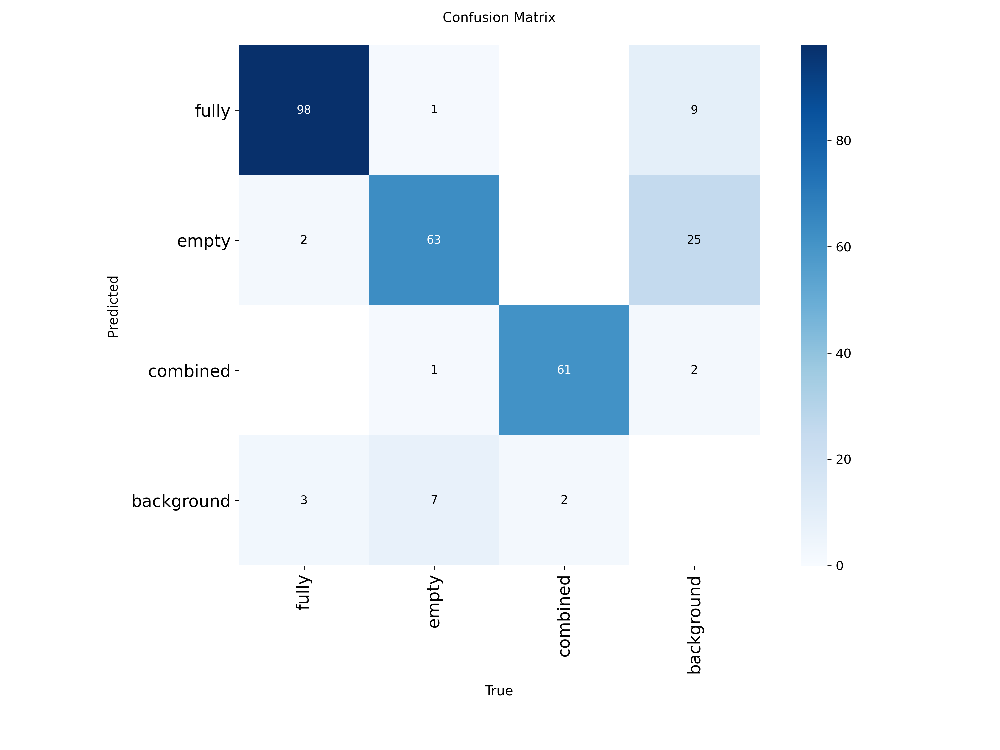


confusion_matrix_normalized.png


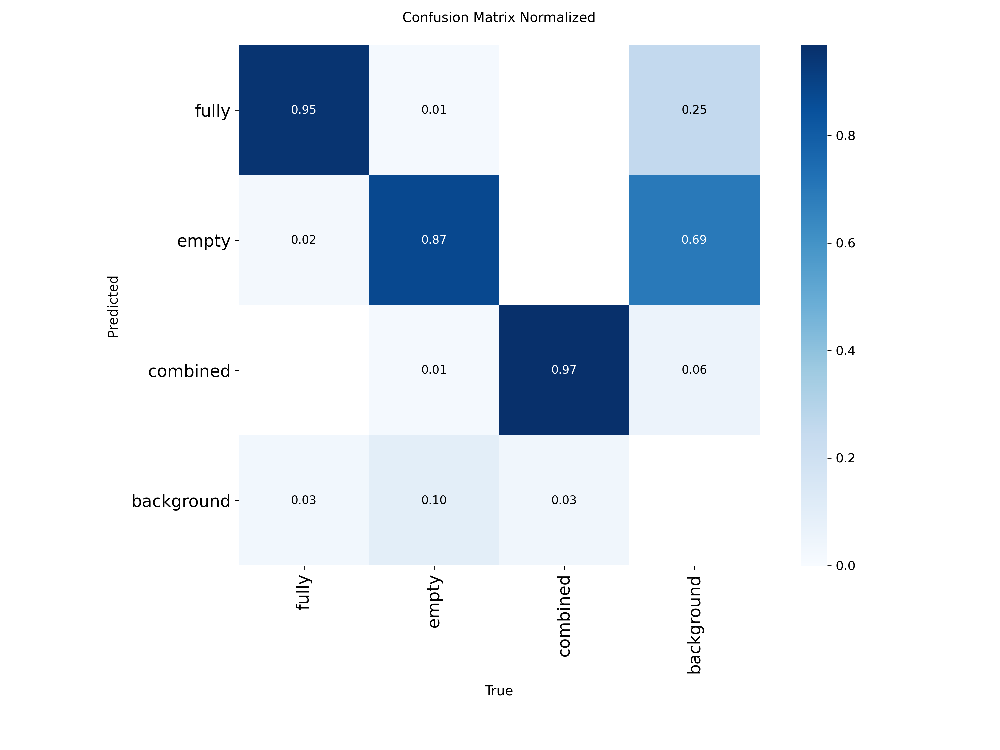


F1_curve.png not found

P_curve.png not found

R_curve.png not found

PR_curve.png not found


In [10]:
# 학습 결과 시각화
from IPython.display import Image, display
import os

results_dir = 'runs/train/yolo11n_mca'

# 결과 이미지들 표시
result_images = [
    'results.png',
    'confusion_matrix.png',
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png'
]

for img_name in result_images:
    img_path = os.path.join(results_dir, img_name)
    if os.path.exists(img_path):
        print(f"\n{'='*60}")
        print(f"{img_name}")
        print('='*60)
        display(Image(filename=img_path))
    else:
        print(f"\n{img_name} not found")

In [11]:
# 최적 모델로 검증
best_model = YOLO('runs/train/yolo11n_mca/weights/best.pt')

# 검증 세트 평가
metrics = best_model.val(data='data.yaml')

print("\n" + "="*60)
print("Validation Metrics")
print("="*60)
print(f"mAP50:     {metrics.box.map50:.4f}")
print(f"mAP50-95:  {metrics.box.map:.4f}")
print(f"Precision: {metrics.box.mp:.4f}")
print(f"Recall:    {metrics.box.mr:.4f}")
print("="*60)

# 클래스별 성능
print("\nPer-class metrics:")
class_names = ['fully', 'empty', 'combined']
if hasattr(metrics.box, 'maps'):
    for i, class_name in enumerate(class_names):
        print(f"  {class_name}: mAP50-95 = {metrics.box.maps[i]:.4f}")

Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2450.8±1074.7 MB/s, size: 2329.0 KB)
val: Scanning /content/MCA/dataset/labels/val.cache... 195 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 195/195 342.8Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 13/13 1.2it/s 10.7s
                   all        195        238      0.933      0.922      0.945      0.696
                 fully         97        103       0.97       0.95       0.97      0.772
                 empty         62         72      0.845      0.861      0.877      0.598
              combined         47         63      0.984      0.956      0.988      0.717
Speed: 1.9ms preprocess, 7.5ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to /content/MCA/runs/detect/val


Running predictions on sample images...


image 1/1 /content/MCA/dataset/images/val/empty_98.jpg: 640x480 1 empty, 87.1ms
Speed: 5.0ms preprocess, 87.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 480)
Results saved to /content/MCA/runs/predict/yolo11n_mca_test
Predicted: empty_98.jpg

image 1/1 /content/MCA/dataset/images/val/empty_126.jpg: 384x640 1 empty, 118.1ms
Speed: 3.3ms preprocess, 118.1ms inference, 3.9ms postprocess per image at shape (1, 3, 384, 640)
Results saved to /content/MCA/runs/predict/yolo11n_mca_test
Predicted: empty_126.jpg

image 1/1 /content/MCA/dataset/images/val/empty_37.jpg: 640x384 1 empty, 203.2ms
Speed: 4.3ms preprocess, 203.2ms inference, 7.7ms postprocess per image at shape (1, 3, 640, 384)
Results saved to /content/MCA/runs/predict/yolo11n_mca_test
Predicted: empty_37.jpg

image 1/1 /content/MCA/dataset/images/val/fully_187.jpg: 640x480 1 fully, 20.7ms
Speed: 4.8ms preprocess, 20.7ms inference, 2.0ms postprocess per image at shape (1, 3

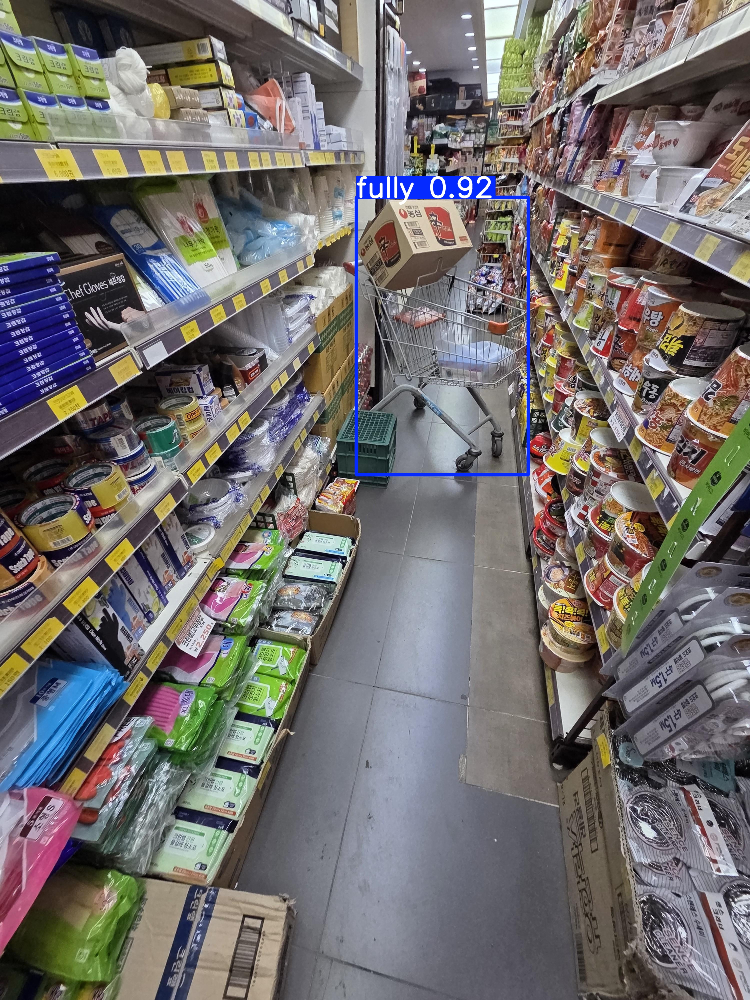


Prediction: empty_98.jpg


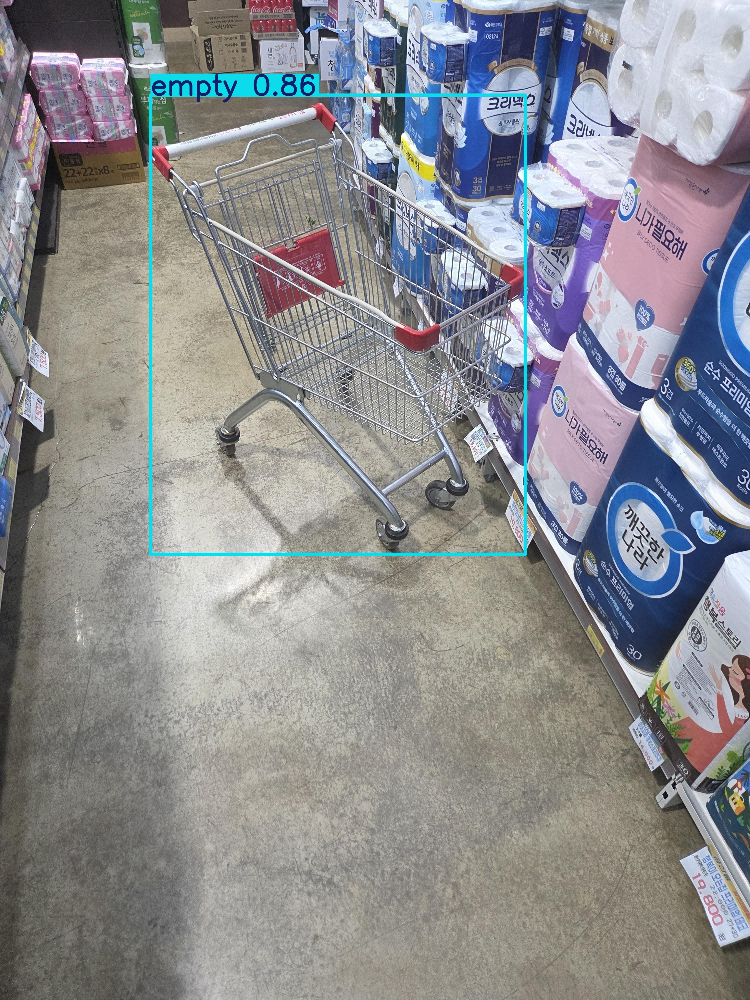


Prediction: empty_126.jpg


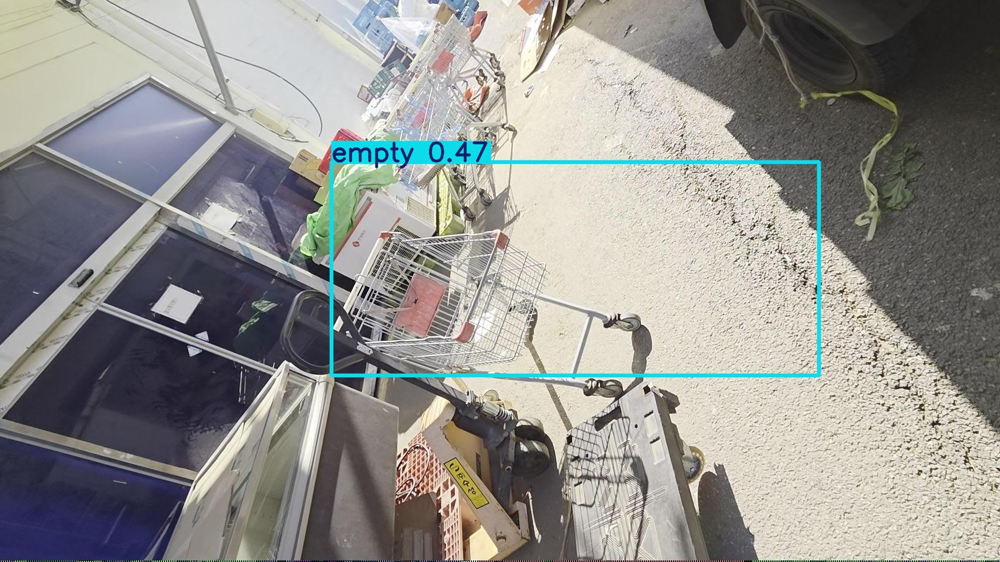


Prediction: combined_49.jpg


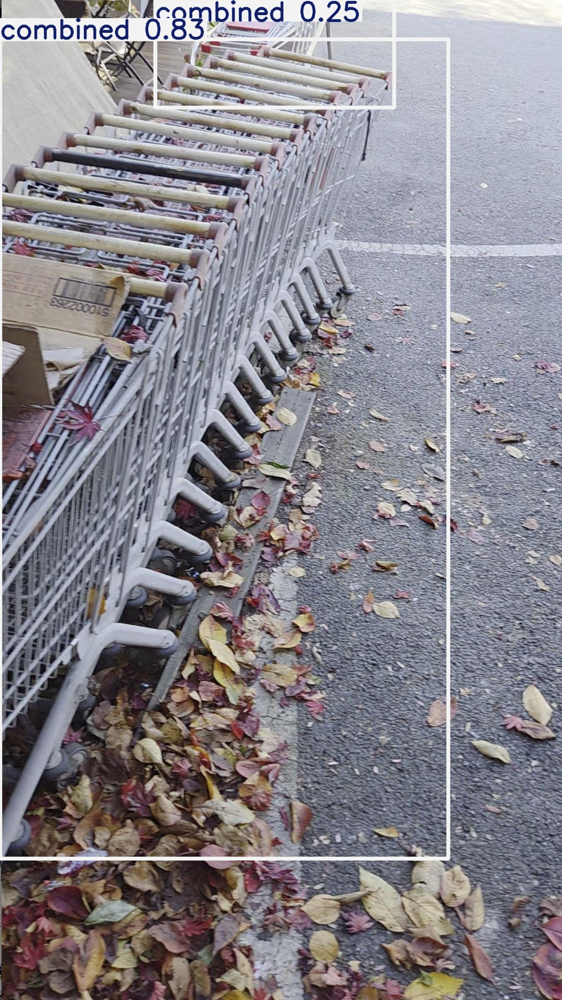


Prediction: empty_37.jpg


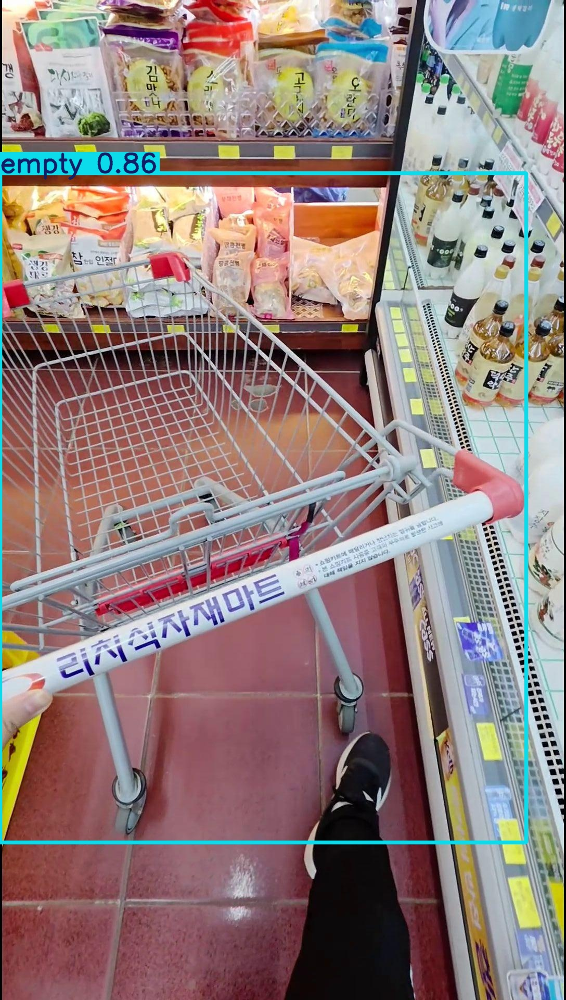

In [12]:
from IPython.display import Image, display
import random
from pathlib import Path

# 검증 세트에서 랜덤 이미지 선택
val_images = list(Path('dataset/images/val').glob('*.jpg'))
sample_images = random.sample(val_images, min(5, len(val_images)))

print("Running predictions on sample images...\n")

# 예측 수행
for img_path in sample_images:
    results = best_model.predict(
        source=str(img_path),
        save=True,
        project='runs/predict',
        name='yolo11n_mca_test',
        exist_ok=True,
        conf=0.25
    )

    print(f"Predicted: {img_path.name}")

print("\nPrediction results saved to: runs/predict/yolo11n_mca_test/")

# 예측 결과 이미지 표시
pred_images = list(Path('runs/predict/yolo11n_mca_test').glob('*.jpg'))[:5]
for pred_img in pred_images:
    print(f"\nPrediction: {pred_img.name}")
    display(Image(filename=str(pred_img), width=600))

In [13]:
# Git 사용자 정보 설정 (본인의 정보로 변경)
!git config --global user.email "24457545yong@gmail.com"
!git config --global user.name "TaeWoongYoun"

# 작업 디렉토리 확인
%cd /content/MCA

/content/MCA


In [14]:
# yolo11n_results 폴더 생성
import os
import shutil

results_backup_dir = 'yolo11n_results'
if os.path.exists(results_backup_dir):
    shutil.rmtree(results_backup_dir)
os.makedirs(results_backup_dir)

# 중요한 파일만 복사
!cp runs/train/yolo11n_mca/weights/best.pt yolo11n_results/
!cp runs/train/yolo11n_mca/weights/last.pt yolo11n_results/
!cp runs/train/yolo11n_mca/*.png yolo11n_results/
!cp runs/train/yolo11n_mca/*.csv yolo11n_results/ 2>/dev/null || true
!cp data.yaml yolo11n_results/

print("Results prepared for commit")
!ls -lh yolo11n_results/

Results prepared for commit
total 12M
-rw-r--r-- 1 root root 5.3M Dec  1 08:44 best.pt
-rw-r--r-- 1 root root 171K Dec  1 08:44 BoxF1_curve.png
-rw-r--r-- 1 root root 136K Dec  1 08:44 BoxP_curve.png
-rw-r--r-- 1 root root 112K Dec  1 08:44 BoxPR_curve.png
-rw-r--r-- 1 root root 147K Dec  1 08:44 BoxR_curve.png
-rw-r--r-- 1 root root 135K Dec  1 08:44 confusion_matrix_normalized.png
-rw-r--r-- 1 root root 113K Dec  1 08:44 confusion_matrix.png
-rw-r--r-- 1 root root  103 Dec  1 08:44 data.yaml
-rw-r--r-- 1 root root 5.3M Dec  1 08:44 last.pt
-rw-r--r-- 1 root root  30K Dec  1 08:44 results.csv
-rw-r--r-- 1 root root 259K Dec  1 08:44 results.png


In [15]:
# .gitignore 업데이트
gitignore_content = """
# Training datasets
dataset/
runs/
backup_old/

# Python
__pycache__/
*.pyc
*.pyo

# Temporary files
temp_restore/
*.tmp

# Old results
yolo11s_results/
"""

with open('.gitignore', 'a') as f:
    f.write(gitignore_content)

print(".gitignore updated")

.gitignore updated


In [16]:
# Git 상태 확인
!git status

On branch main
Your branch is up to date with 'origin/main'.

Changes not staged for commit:
  (use "git add <file>..." to update what will be committed)
  (use "git restore <file>..." to discard changes in working directory)
	modified:   .gitignore

Untracked files:
  (use "git add <file>..." to include in what will be committed)
	data.yaml
	yolo11n_results/

no changes added to commit (use "git add" and/or "git commit -a")


In [17]:
# GitHub 인증 토큰 입력
from getpass import getpass

print("GitHub Personal Access Token을 입력하세요:")
print("(Settings > Developer settings > Personal access tokens에서 생성)")
github_token = getpass("Token: ")

# 원격 저장소 URL 재설정
!git remote set-url origin https://{github_token}@github.com/ICT-Top-Bottom/MCA.git

print("\nGitHub authentication configured")

GitHub Personal Access Token을 입력하세요:
(Settings > Developer settings > Personal access tokens에서 생성)
Token: ··········

GitHub authentication configured


In [18]:
# 변경사항 커밋 및 푸시
!git add yolo11n_results/
!git add .gitignore
!git commit -m "add: YOLO11n training results (649 images, 3 classes: fully/empty/combined)"
!git push origin main

print("\nPushed to GitHub successfully!")

[main e661bc0] add: YOLO11n training results (649 images, 3 classes: fully/empty/combined)
 12 files changed, 274 insertions(+)
 create mode 100644 yolo11n_results/BoxF1_curve.png
 create mode 100644 yolo11n_results/BoxPR_curve.png
 create mode 100644 yolo11n_results/BoxP_curve.png
 create mode 100644 yolo11n_results/BoxR_curve.png
 create mode 100644 yolo11n_results/best.pt
 create mode 100644 yolo11n_results/confusion_matrix.png
 create mode 100644 yolo11n_results/confusion_matrix_normalized.png
 create mode 100644 yolo11n_results/data.yaml
 create mode 100644 yolo11n_results/last.pt
 create mode 100644 yolo11n_results/results.csv
 create mode 100644 yolo11n_results/results.png
Enumerating objects: 17, done.
Counting objects: 100% (17/17), done.
Delta compression using up to 2 threads
Compressing objects: 100% (15/15), done.
Writing objects: 100% (15/15), 10.30 MiB | 7.98 MiB/s, done.
Total 15 (delta 1), reused 0 (delta 0), pack-reused 0
remote: Resolving deltas: 100% (1/1), complete

In [19]:
import json
from datetime import datetime

# 학습 요약 정보 생성
summary = {
    "training_date": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "model": "YOLO11n",
    "configuration": {
        "epochs": 100,
        "batch_size": 16,
        "image_size": 640,
        "optimizer": "AdamW",
        "patience": 30,
        "train_val_split": "7:3"
    },
    "dataset": {
        "total_images": 649,
        "total_labels": 649,
        "combined": 128,
        "empty": 174,
        "fully": 347,
        "source": "b0407c7 images/labels + v2label + 73b0ab8 insImg (merged and renamed)"
    },
    "classes": {
        "0": "fully (완전히 찬 카트)",
        "1": "empty (빈 카트)",
        "2": "combined (중간 카트)"
    },
    "results_location": {
        "local": "runs/train/yolo11n_mca",
        "github": "yolo11n_results/",
        "drive": "/content/drive/MyDrive/MCA_YOLO11n/"
    },
    "notes": [
        "All filenames standardized to combined_N, empty_N, fully_N format",
        "ce_ files (combined+empty) split into both categories",
        "ef_ files (empty+fully) split into both categories",
        "All images have corresponding labels (649:649)"
    ]
}

print("=" * 60)
print("YOLO11n Training Summary")
print("=" * 60)
print(json.dumps(summary, indent=2, ensure_ascii=False))
print("=" * 60)

# 요약 파일 저장
with open('yolo11n_results/training_summary.json', 'w', encoding='utf-8') as f:
    json.dump(summary, f, indent=2, ensure_ascii=False)

print("\nTraining summary saved to yolo11n_results/training_summary.json")

YOLO11n Training Summary
{
  "training_date": "2025-12-01 08:49:33",
  "model": "YOLO11n",
  "configuration": {
    "epochs": 100,
    "batch_size": 16,
    "image_size": 640,
    "optimizer": "AdamW",
    "patience": 30,
    "train_val_split": "7:3"
  },
  "dataset": {
    "total_images": 649,
    "total_labels": 649,
    "combined": 128,
    "empty": 174,
    "fully": 347,
    "source": "b0407c7 images/labels + v2label + 73b0ab8 insImg (merged and renamed)"
  },
  "classes": {
    "0": "fully (완전히 찬 카트)",
    "1": "empty (빈 카트)",
    "2": "combined (중간 카트)"
  },
  "results_location": {
    "local": "runs/train/yolo11n_mca",
    "github": "yolo11n_results/",
    "drive": "/content/drive/MyDrive/MCA_YOLO11n/"
  },
  "notes": [
    "All filenames standardized to combined_N, empty_N, fully_N format",
    "ce_ files (combined+empty) split into both categories",
    "ef_ files (empty+fully) split into both categories",
    "All images have corresponding labels (649:649)"
  ]
}

Training su